# Assingment Task: Real Time License Plate Detection Model

# YOLOv8n for License Plate Detection?

Lightweight & Fast
YOLOv8n (nano) is the smallest variant in the YOLOv8 family.
Its reduced size makes it faster on real-time systems (e.g. traffic cameras), which is crucial for license plate detection where speed matters.
High Accuracy on Small Objects License plates are relatively small and often at varying angles.
YOLOv8n's improved architecture and anchor-free approach help detect small targets more reliably than older YOLO versions (v3, v4, v5, v7).
Comparison with “YOLOv11” or Future Versions
While upcoming versions may promise higher accuracy, they often come with larger model sizes or higher computation needs. YOLOv8n strikes a balance between performance and resource usage, ideal for embedded devices or low-end GPUs.
Community Support & Documentation
YOLOv8 is officially released by Ultralytics, ensuring solid documentation and community-driven improvements. Experimental or hypothetical releases might lack maturity and broad support.
Overall, YOLOv8n provides a sweet spot of speed, accuracy, and smaller memory footprint—perfect for real-time license plate detection.

-----------------


# 3. Installing & Importing Libraries

In [1]:
%%capture
!pip install ultralytics
# !pip install albumentations

In [2]:
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import yaml
import torch
from PIL import Image
from IPython.display import display, Video
from ultralytics import YOLO
from collections import deque
import subprocess  # For executing ffmpeg

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Data Downolading from kaggledatset using kaggle hub

In [4]:
!pip install kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [5]:
! kaggle datasets download aslanahmedov/number-plate-detection
! kaggle datasets download nimishshandilya/car-number-plate-video
! kaggle datasets download ronakgohil/license-plate-dataset

print("Files Dowloaded Successfully...")

Dataset URL: https://www.kaggle.com/datasets/aslanahmedov/number-plate-detection
License(s): copyright-authors
 93% 382M/413M [00:00<00:00, 439MB/s]
100% 413M/413M [00:00<00:00, 469MB/s]
Dataset URL: https://www.kaggle.com/datasets/nimishshandilya/car-number-plate-video
License(s): apache-2.0
 95% 416M/436M [00:01<00:00, 259MB/s]
100% 436M/436M [00:01<00:00, 291MB/s]
Dataset URL: https://www.kaggle.com/datasets/ronakgohil/license-plate-dataset
License(s): CC0-1.0
 50% 74.0M/147M [00:00<00:00, 772MB/s]
100% 147M/147M [00:00<00:00, 796MB/s] 
Files Dowloaded Successfully...


In [6]:
# Define the path to your zip file
zip_file_path = '/content/car-number-plate-video.zip' # Replace with the actual path

# Define the directory where you want to extract the contents
extraction_directory = '/content/car-number-plate-video' # Replace with your desired path

# Unzip the file
!unzip {zip_file_path} -d {extraction_directory}

# Define the path to your zip file
zip_file_path = '/content/license-plate-dataset.zip' # Replace with the actual path

# Define the directory where you want to extract the contents
extraction_directory = '/content/license-plate-dataset' # Replace with your desired path

# Unzip the file
!unzip {zip_file_path} -d {extraction_directory}

# Define the path to your zip file
zip_file_path = '/content/number-plate-detection.zip' # Replace with the actual path

# Define the directory where you want to extract the contents
extraction_directory = '/content/number-plate-detection' # Replace with your desired path

# Unzip the file
!unzip {zip_file_path} -d {extraction_directory}

Archive:  /content/car-number-plate-video.zip
  inflating: /content/car-number-plate-video/Automatic Number Plate Recognition (ANPR) _ Vehicle Number Plate Recognition (1).mp4  
  inflating: /content/car-number-plate-video/Traffic Control CCTV.mp4  
  inflating: /content/car-number-plate-video/pexels-casey-whalen-6571483 (2160p).mp4  
  inflating: /content/car-number-plate-video/pexels-christopher-schultz-5927708 (1080p).mp4  
  inflating: /content/car-number-plate-video/pexels-george-morina-5222550 (2160p).mp4  
  inflating: /content/car-number-plate-video/pexels-george-morina-5293898 (1080p).mp4  
  inflating: /content/car-number-plate-video/pexels-george-morina-6719160 (2160p).mp4  
  inflating: /content/car-number-plate-video/pexels-taryn-elliott-5309381 (1080p).mp4  
Archive:  /content/license-plate-dataset.zip
  inflating: /content/license-plate-dataset/archive/classes.txt  
  inflating: /content/license-plate-dataset/archive/dataset.yaml  
  inflating: /content/license-plate-dat

# 4. Why data.yaml?

The data.yaml file is used by YOLO to:
Specify dataset paths (train, val, test).
Define the number of classes (nc>) and their names.
This helps YOLO know where to find your data and how to handle it during training.

In [7]:
# Define dataset paths
train_dir = "/content/license-plate-dataset/archive/images/train"
val_dir = "/content/license-plate-dataset/archive/images/val"

# Define class names
classes = ["license_plate"]  # Add more classes if needed

# Create YAML content
data_yaml_content = f"""
train: {train_dir}
val: {val_dir}

nc: {len(classes)}  # Number of classes
names: {classes}  # Class names
"""

# Save to a file
yaml_path = "/content/license-plate-dataset/archive/dataset.yaml"

# Create the directory if it doesn't exist
os.makedirs(os.path.dirname(yaml_path), exist_ok=True)

with open(yaml_path, "w") as f:
    f.write(data_yaml_content)

# Display the content for verification
!cat {yaml_path}


train: /content/license-plate-dataset/archive/images/train
val: /content/license-plate-dataset/archive/images/val

nc: 1  # Number of classes
names: ['license_plate']  # Class names


# 5. What is YOLOv8?

YOLOv8 is the latest version of the YOLO family by Ultralytics,
1. Faster and more accurate object detection.
2. Anchor-free design for better small object recognition.
3. Easy deployment in various environments.
Its balance of speed and precision makes it ideal for tasks like license plate detection, surveillance, and autonomous driving.

In [8]:
model = YOLO("yolov8n.pt")

# 6. Training the Model

### Fine-Tuning YOLOv8 on License Plate Detection Dataset

In [9]:
results = model.train(
    data="/content/license-plate-dataset/archive/dataset.yaml",
    epochs=50,
    imgsz=640,
    lr0= 0.0005,
    batch=32,
    lrf=0.1,
    augment=True
)

Ultralytics 8.3.174 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/license-plate-dataset/archive/dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

Model summary: 129 layers, 3,011,043 parameters, 3,011,027 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 821.6±388.9 MB/s, size: 24.6 KB)


train: Scanning /content/license-plate-dataset/archive/labels/train... 1526 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1526/1526 [00:00<00:00, 1590.90it/s]

train: /content/license-plate-dataset/archive/images/train/car-wbs-MH03AR5549_00000.jpg: corrupt JPEG restored and saved
train: New cache created: /content/license-plate-dataset/archive/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 497.7±87.7 MB/s, size: 162.0 KB)


val: Scanning /content/license-plate-dataset/archive/labels/val... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<00:00, 1335.71it/s]

val: New cache created: /content/license-plate-dataset/archive/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0005' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.14G      1.031      2.142      1.053         39        640: 100%|██████████| 48/48 [00:29<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.16s/it]

                   all        169        169          1      0.126      0.689      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      5.11G     0.9493      1.151     0.9683         42        640: 100%|██████████| 48/48 [00:26<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

                   all        169        169      0.907      0.746      0.859      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.13G     0.9254     0.8997     0.9759         32        640: 100%|██████████| 48/48 [00:26<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.27it/s]

                   all        169        169      0.898      0.886      0.948      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      5.15G     0.9263     0.7833     0.9756         56        640: 100%|██████████| 48/48 [00:26<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.09it/s]

                   all        169        169      0.949      0.889      0.964      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      5.17G     0.9093     0.7099     0.9767         39        640: 100%|██████████| 48/48 [00:24<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.37it/s]

                   all        169        169      0.959      0.966      0.989      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      5.18G     0.8527     0.6361      0.967         39        640: 100%|██████████| 48/48 [00:25<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]

                   all        169        169      0.923      0.911      0.955      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       5.2G     0.8493     0.6139     0.9551         29        640: 100%|██████████| 48/48 [00:25<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.48it/s]

                   all        169        169      0.976       0.96      0.981      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      5.22G     0.8278     0.5711     0.9477         34        640: 100%|██████████| 48/48 [00:25<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.51it/s]

                   all        169        169      0.974      0.964       0.99      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      5.23G     0.8113     0.5628     0.9402         44        640: 100%|██████████| 48/48 [00:25<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.61it/s]

                   all        169        169      0.971      0.981      0.986      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      5.25G     0.8094     0.5554     0.9404         43        640: 100%|██████████| 48/48 [00:25<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.23it/s]

                   all        169        169      0.979       0.97      0.991       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      5.27G     0.7996     0.5339     0.9368         41        640: 100%|██████████| 48/48 [00:25<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.51it/s]

                   all        169        169      0.988      0.987      0.995      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.29G      0.786     0.5266     0.9381         35        640: 100%|██████████| 48/48 [00:26<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.43it/s]

                   all        169        169      0.977      0.991      0.993      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       5.3G     0.7855     0.5109      0.938         45        640: 100%|██████████| 48/48 [00:25<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.64it/s]

                   all        169        169       0.97      0.988      0.992      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      5.32G     0.7715     0.5078      0.931         35        640: 100%|██████████| 48/48 [00:26<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

                   all        169        169       0.99       0.97      0.992      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      5.34G     0.7532     0.4851     0.9185         43        640: 100%|██████████| 48/48 [00:25<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.03it/s]

                   all        169        169      0.976      0.976      0.984      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      5.35G     0.7403     0.4757       0.91         36        640: 100%|██████████| 48/48 [00:25<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

                   all        169        169       0.97       0.97      0.992      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.37G     0.7298     0.4704     0.9173         48        640: 100%|██████████| 48/48 [00:25<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all        169        169      0.971      0.979       0.99      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.39G     0.7355     0.4655      0.917         34        640: 100%|██████████| 48/48 [00:25<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

                   all        169        169      0.989      0.982      0.994      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       5.4G     0.7266     0.4542     0.9075         46        640: 100%|██████████| 48/48 [00:25<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

                   all        169        169      0.994      0.987      0.994      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      5.42G     0.7152     0.4506     0.9089         35        640: 100%|██████████| 48/48 [00:27<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all        169        169      0.965      0.984      0.991      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      5.44G     0.7019     0.4373     0.9109         45        640: 100%|██████████| 48/48 [00:24<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.15it/s]

                   all        169        169      0.965      0.969       0.99      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.46G     0.6934     0.4407     0.9006         40        640: 100%|██████████| 48/48 [00:25<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]

                   all        169        169      0.982      0.986      0.993      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      5.47G     0.7051     0.4351     0.9022         43        640: 100%|██████████| 48/48 [00:25<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.51it/s]

                   all        169        169      0.993      0.988      0.994       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.49G      0.679     0.4244     0.8957         48        640: 100%|██████████| 48/48 [00:25<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.86it/s]

                   all        169        169       0.96      0.999       0.99       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.51G     0.6769     0.4331     0.9007         44        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

                   all        169        169      0.971      0.992      0.993      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      5.52G     0.6724     0.4149     0.8953         44        640: 100%|██████████| 48/48 [00:25<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

                   all        169        169      0.993      0.988      0.992      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      5.54G     0.6623     0.4093     0.8919         38        640: 100%|██████████| 48/48 [00:25<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.26it/s]

                   all        169        169      0.986      0.982      0.989      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.56G     0.6548      0.405     0.8914         40        640: 100%|██████████| 48/48 [00:26<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.69it/s]

                   all        169        169      0.977      0.993      0.991      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.57G     0.6606     0.4063     0.8915         35        640: 100%|██████████| 48/48 [00:26<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]

                   all        169        169      0.987      0.988      0.991      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.59G     0.6648     0.4101      0.889         39        640: 100%|██████████| 48/48 [00:25<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]

                   all        169        169      0.982      0.994      0.994      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.61G     0.6543     0.3961     0.8886         45        640: 100%|██████████| 48/48 [00:26<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.59it/s]

                   all        169        169      0.993      0.994      0.994      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.63G     0.6651     0.3943     0.8864         37        640: 100%|██████████| 48/48 [00:26<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.13it/s]

                   all        169        169      0.993      0.994      0.994      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      5.64G     0.6412     0.3876     0.8854         41        640: 100%|██████████| 48/48 [00:26<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.64it/s]

                   all        169        169      0.981      0.994      0.992       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      5.66G     0.6365     0.3818     0.8849         38        640: 100%|██████████| 48/48 [00:26<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

                   all        169        169      0.986      0.994      0.994      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      5.68G     0.6396     0.3797     0.8795         44        640: 100%|██████████| 48/48 [00:25<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

                   all        169        169      0.993      0.994      0.995      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       5.7G     0.6253     0.3746     0.8873         41        640: 100%|██████████| 48/48 [00:26<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

                   all        169        169      0.989      0.976       0.99       0.86



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      5.71G     0.6251     0.3692     0.8763         42        640: 100%|██████████| 48/48 [00:28<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

                   all        169        169      0.992      0.994      0.993      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.73G     0.6066     0.3614     0.8719         45        640: 100%|██████████| 48/48 [00:26<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

                   all        169        169      0.986      0.994      0.989       0.86



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      5.75G     0.6075     0.3617     0.8769         40        640: 100%|██████████| 48/48 [00:25<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]

                   all        169        169      0.982      0.988      0.992      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.76G     0.6085      0.358     0.8756         39        640: 100%|██████████| 48/48 [00:26<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

                   all        169        169      0.986      0.994      0.993       0.88


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      5.78G     0.5685     0.3271     0.8478         22        640: 100%|██████████| 48/48 [00:27<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.20it/s]

                   all        169        169      0.984      0.994      0.995      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       5.8G     0.5747     0.3247     0.8505         22        640: 100%|██████████| 48/48 [00:24<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]

                   all        169        169      0.987      0.994      0.995      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      5.81G     0.5741     0.3226     0.8503         22        640: 100%|██████████| 48/48 [00:25<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all        169        169      0.993      0.994      0.995      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      5.83G     0.5695     0.3191     0.8495         22        640: 100%|██████████| 48/48 [00:24<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

                   all        169        169      0.982      0.994      0.994      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      5.85G     0.5635     0.3123     0.8499         22        640: 100%|██████████| 48/48 [00:25<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

                   all        169        169      0.982      0.988      0.993      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      5.87G     0.5539     0.3023     0.8428         22        640: 100%|██████████| 48/48 [00:24<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        169        169      0.993      0.988      0.994      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      5.88G     0.5312     0.2945     0.8393         22        640: 100%|██████████| 48/48 [00:24<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

                   all        169        169      0.994      0.994      0.994       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       5.9G     0.5251     0.2917      0.836         22        640: 100%|██████████| 48/48 [00:24<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.64it/s]

                   all        169        169      0.994      0.988      0.994       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      5.92G     0.5255     0.2905      0.832         22        640: 100%|██████████| 48/48 [00:25<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

                   all        169        169      0.992      0.994      0.994      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      5.93G     0.5206     0.2834     0.8274         21        640: 100%|██████████| 48/48 [00:25<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.49it/s]

                   all        169        169      0.992      0.994      0.995       0.89



50 epochs completed in 0.397 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.174 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.06s/it]


                   all        169        169      0.982      0.994      0.993      0.875
Speed: 0.2ms preprocess, 11.8ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/train


# 7. Training Results
### Visualizing the performance of YOLOv8 after training


In [24]:
train_results = "/kaggle/working/runs/detect/train/results.png"

if os.path.exists(train_results):
    img = Image.open(train_results)  # Use PIL to read the image
    display(img)  # Display the image
else:
    print("Training results image not found.")



Training results image not found.


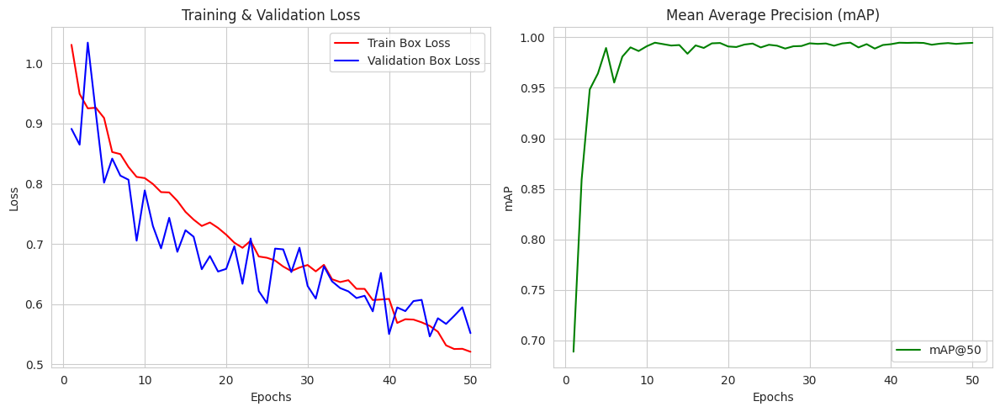

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Path to the results CSV file
results_csv_path = "/content/runs/detect/train/results.csv"

# Read the results CSV file
df = pd.read_csv(results_csv_path)

# Remove leading and trailing spaces from column names
df.columns = df.columns.str.strip()

# Define column names for plotting
map_column = "metrics/mAP50(B)"
loss_column_train = "train/box_loss"
loss_column_val = "val/box_loss"

plt.figure(figsize=(12, 5))
sns.set_style("whitegrid")

# Plot Train Loss and Validation Loss
plt.subplot(1, 2, 1)
plt.plot(df["epoch"], df[loss_column_train], label="Train Box Loss", color="red")
plt.plot(df["epoch"], df[loss_column_val], label="Validation Box Loss", color="blue")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()

# Plot mAP@50
plt.subplot(1, 2, 2)
plt.plot(df["epoch"], df[map_column], label="mAP@50", color="green")
plt.xlabel("Epochs")
plt.ylabel("mAP")
plt.title("Mean Average Precision (mAP)")
plt.legend()

plt.tight_layout()
plt.show()


image 1/1 /content/number-plate-detection/images/N227.jpeg: 384x640 1 license_plate, 135.7ms
Speed: 6.2ms preprocess, 135.7ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/number-plate-detection/images/N118.jpeg: 480x640 1 license_plate, 111.9ms
Speed: 4.1ms preprocess, 111.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/number-plate-detection/images/N90.jpeg: 512x640 1 license_plate, 104.1ms
Speed: 3.3ms preprocess, 104.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 /content/number-plate-detection/images/N54.jpeg: 448x640 1 license_plate, 116.1ms
Speed: 2.2ms preprocess, 116.1ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/number-plate-detection/images/N53.jpeg: 352x640 1 license_plate, 82.9ms
Speed: 1.9ms preprocess, 82.9ms inference, 1.7ms postprocess per image at shape (1, 3, 352, 640)

image 1/1 /content/number-plate-detection/im

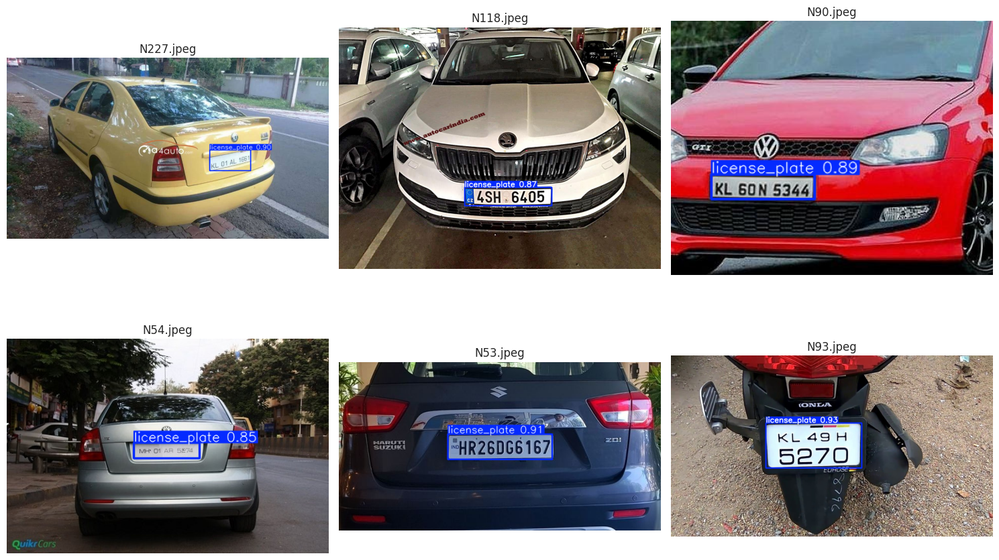

In [20]:
import glob
# Collect all images from the directory
all_images = glob.glob("/content/number-plate-detection/images/*.jpeg")

# Randomly select 6 different images each time
test_images = random.sample(all_images, 6)

# Create a figure with 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    results = model(img_path)      # Run YOLO on the image
    result_img = results[0].plot() # Get the annotated image

    # Convert the annotated image to RGB for plotting
    img_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)
    ax.axis("off")
    ax.set_title(os.path.basename(img_path))  # Show the image filename

plt.tight_layout()
plt.show()

# 8. Training & Evaluating on Video

### In this section, we use YOLO to process a video, apply the trained model, and visualize the results.

In [22]:
# Load the trained YOLOv8 model
model_path = "/content/yolov8n.pt"
model = YOLO(model_path)

# Define input and output video paths
input_video = "/content/car-number-plate-video/Automatic Number Plate Recognition (ANPR) _ Vehicle Number Plate Recognition (1).mp4"
output_video = "/content/output_video.mp4"
compressed_video = "/content/output_video_compressed.mp4"  # Compressed version

# Open the input video file
cap = cv2.VideoCapture(input_video)

# Get video properties
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(output_video, fourcc, fps, (width, height))

# Process video frame by frame
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Run YOLOv8 on the frame
    results = model(frame, verbose=False)  # No extra logs

    # Draw bounding boxes
    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            conf = box.conf[0].item()
            label = f"Plate {conf:.2f}"

            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Write frame to output video
    out.write(frame)
    frame_count += 1

# Release video resources
cap.release()
out.release()
cv2.destroyAllWindows()
print(f"Detection completed! Processed {frame_count} frames.")

# **Compress the video using FFmpeg**
print("Compressing video... (This may take a few seconds)")
ffmpeg_command = [
    "ffmpeg", "-i", output_video, "-vcodec", "libx264", "-crf", "28", "-preset", "fast", compressed_video
]
subprocess.run(ffmpeg_command, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
print("Compression done!")

# Function to display video in Jupyter Notebook (Kaggle Compatible)
from IPython.display import HTML
from base64 import b64encode

def play_video(file_path, width=800):
    """Display a video file directly in a Jupyter Notebook (Kaggle compatible)."""
    try:
        with open(file_path, "rb") as video_file:
            video_data = video_file.read()
            video_base64 = b64encode(video_data).decode()
    except FileNotFoundError:
        return HTML("<p style='color:red;'> Error: Video file not found!</p>")

    video_html = f"""
    <video width="{width}" controls autoplay loop>
        <source src="data:video/mp4;base64,{video_base64}" type="video/mp4">
        Your browser does not support the video tag.
    </video>
    """

    return HTML(video_html)

# Display the compressed video
play_video(compressed_video, width=1000)


Detection completed! Processed 930 frames.
Compressing video... (This may take a few seconds)
Compression done!


-----------------

# Assigned Task is Completed Thank You!

I appreciate you taking the time to review my work! Your feedback is invaluable, and I'm always looking for ways to improve.  

Feel free to leave any suggestions, questions, or improvements.